In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
pip install open3d

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.7/399.7 MB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 79.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 73.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 79.3 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.6
    Uninstalling widgetsnbextension-3.6.6:
      Successfully uninstalled widgetsnbextension-3.6.6
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1


Part 1


In [4]:
import os
import open3d as o3d
import numpy as np

pcd_dir = "/content/drive/MyDrive/CV-A2-calibration/lidar_scans/"


K = np.array(np.loadtxt("/content/drive/MyDrive/CV-A2-calibration/camera_parameters/camera_intrinsic.txt"))
camera_intrinsic = np.zeros((3,4))
camera_intrinsic[:3,:3] = K

plane_normals = {}
offsets = {}


pcd_files = [f for f in os.listdir(pcd_dir) if f.endswith(".pcd")]

pcd_files.sort()

pcd_files1 = pcd_files[:25]

cnt=1

for pcd_file in pcd_files:
    pcd_path = os.path.join(pcd_dir, pcd_file)
    pcd = o3d.io.read_point_cloud(pcd_path)
    points = np.asarray(pcd.points)
    centroid = np.mean(points, axis=0)
    centered_points = points - centroid

    u, sigma, v_t = np.linalg.svd(centered_points.T @ centered_points, full_matrices=False)
    normal = u[:, 2]

    offset = np.dot(normal, centroid)
    if offset < 0:
        offset = -offset
        normal = -normal

    plane_normals[cnt]=normal.reshape(3)
    offsets[cnt]=offset
    if(cnt<26):
      print("File ", cnt, "/25: Normal:", normal, "Offset:", offset)
    cnt+=1

File  1 /25: Normal: [ 0.63693437 -0.76499839  0.09535237] Offset: 4.993811298096004
File  2 /25: Normal: [ 0.70169742 -0.70118932  0.1263102 ] Offset: 4.72077965972876
File  3 /25: Normal: [ 0.93809241 -0.22958973  0.25936688] Offset: 5.204305546806318
File  4 /25: Normal: [ 0.72352642 -0.68812782 -0.05467752] Offset: 4.7935016262124694
File  5 /25: Normal: [ 0.83333533 -0.55208241  0.02751785] Offset: 5.220803337324182
File  6 /25: Normal: [ 0.91935323 -0.3607026   0.15710911] Offset: 5.702524575286329
File  7 /25: Normal: [0.94151039 0.18949708 0.27865578] Offset: 6.323572215248567
File  8 /25: Normal: [ 0.81878735  0.50763718 -0.26812639] Offset: 6.445439719171264
File  9 /25: Normal: [ 0.93288206 -0.2440387   0.26490788] Offset: 5.6742584632412605
File  10 /25: Normal: [ 0.95207118 -0.1539658   0.26430097] Offset: 5.743694294895788
File  11 /25: Normal: [ 0.60407281 -0.77412903  0.18926246] Offset: 5.062352211986537
File  12 /25: Normal: [ 0.75932657 -0.56254883  0.32705042] Offse

Part 3

In [5]:
print(pcd_files)

['frame_1061.pcd', 'frame_1075.pcd', 'frame_1093.pcd', 'frame_1139.pcd', 'frame_1153.pcd', 'frame_1163.pcd', 'frame_1195.pcd', 'frame_1366.pcd', 'frame_1430.pcd', 'frame_1473.pcd', 'frame_1558.pcd', 'frame_1580.pcd', 'frame_1638.pcd', 'frame_1698.pcd', 'frame_1725.pcd', 'frame_1798.pcd', 'frame_1816.pcd', 'frame_1850.pcd', 'frame_2030.pcd', 'frame_2107.pcd', 'frame_256.pcd', 'frame_2717.pcd', 'frame_2725.pcd', 'frame_2771.pcd', 'frame_2800.pcd', 'frame_2822.pcd', 'frame_2962.pcd', 'frame_2991.pcd', 'frame_3329.pcd', 'frame_339.pcd', 'frame_457.pcd', 'frame_548.pcd', 'frame_595.pcd', 'frame_607.pcd', 'frame_639.pcd', 'frame_690.pcd', 'frame_795.pcd', 'frame_812.pcd']


In [6]:
from re import A
cnt=1
thetac ={}
alphac = {}
for pcd_file in pcd_files:
    transl= np.array(np.loadtxt(f"/content/drive/MyDrive/CV-A2-calibration/camera_parameters/{pcd_file[:-4]}.jpeg/translation_vectors.txt"))
    nC= np.array(np.loadtxt(f"/content/drive/MyDrive/CV-A2-calibration/camera_parameters/{pcd_file[:-4]}.jpeg/camera_normals.txt"), dtype = np.float32)
    transl= np.array([[transl[0], transl[1], transl[2]]])

    thetac[cnt] = nC
    alphac[cnt] = transl @ thetac[cnt].T
    if( alphac[cnt]< 0):
      alphac[cnt] *=-1
      thetac[cnt] *=-1

    cnt += 1

# print(alphac.values)
values_list = []

for i in range(1, 39):
    values_list.append(alphac[i])
ac = np.array(values_list)
ac = np.squeeze(ac , axis=None)

values_list = []
for i in range(1, 39):
    values_list.append(offsets[i])

al =np.array(values_list)

values_list = []
for i in range(1, 39):
    values_list.append(plane_normals[i])

tl = np.array(values_list)

values_list = []
for i in range(1, 39):
    values_list.append(thetac[i])

tc = np.array(values_list)
tc = np.squeeze(tc , axis=None)

print("Normal sape: ", tl.shape, tc.shape)
print("Offset shapes: ", al.shape, ac.shape)

Normal sape:  (38, 3) (38, 3)
Offset shapes:  (38,) (38,)


In [9]:
A = tl.T @ tc
# print(A)
u, sigma, v_t = np.linalg.svd(A)
# print(u)
R = v_t.T @ u.T
# print(R)


print(f"Determinant of Rot. matrix: {np.linalg.det(R)}")

inv = np.linalg.inv(tc.T @ tc)
T = inv @ tc.T @ (ac - al)
print("T", T)
print("R", R)

Determinant of Rot. matrix: 0.9999999999999999
T [ 0.08855653 -0.36208156 -0.59925672]
R [[-1.75158877e-01 -9.84540171e-01  1.36162323e-04]
 [ 1.53559962e-02 -2.87025846e-03 -9.99877970e-01]
 [ 9.84420419e-01 -1.75135412e-01  1.56213464e-02]]


In [25]:
transformation_matrix = np.zeros((4, 4))
transformation_matrix[0][0]= R[0][0]
transformation_matrix[0][1]= R[0][1]
transformation_matrix[0][2]= R[0][2]
transformation_matrix[1][0]= R[1][0]
transformation_matrix[1][1]= R[1][1]
transformation_matrix[1][2]= R[1][2]
transformation_matrix[2][0]= R[2][0]
transformation_matrix[2][1]= R[2][1]
transformation_matrix[2][2]= R[2][2]
transformation_matrix[0][3] = T[0]
transformation_matrix[1][3] = T[1]
transformation_matrix[2][3] = T[2]
transformation_matrix[3][3] = 1

print("Transformation matrix cTl")
print(transformation_matrix)

Transformation matrix cTl
[[-1.75158877e-01 -9.84540171e-01  1.36162323e-04  8.85565253e-02]
 [ 1.53559962e-02 -2.87025846e-03 -9.99877970e-01 -3.62081559e-01]
 [ 9.84420419e-01 -1.75135412e-01  1.56213464e-02 -5.99256722e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [26]:
import cv2

projection = []
for pcd_file in pcd_files:
    pcd_path = os.path.join(pcd_dir, pcd_file)
    pcd = o3d.io.read_point_cloud(pcd_path)
    pcd = np.asarray(pcd.points)

    img = cv2.imread(f"/content/drive/MyDrive/CV-A2-calibration/camera_images/{pcd_file[:-4]}.jpeg")
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (8, 6), None)

    points = np.ones((pcd.shape[0], pcd.shape[1]+1))
    points[:points.shape[0],:3] = pcd
    camera_points = (camera_intrinsic @ transformation_matrix @ points.T).T

    homogenous = []
    for current_point in camera_points:
        homogenous.append((current_point / current_point[2])[:2])
    if(ret):
        projection.append(homogenous)




In [27]:
for i in projection:
  print(i)

[array([920.45059064, 468.68764156]), array([920.79165895, 414.66061113]), array([923.18166528, 496.24318175]), array([923.30640695, 468.84953426]), array([923.64476111, 441.59937688]), array([924.04382905, 387.84724378]), array([926.19301643, 496.33649761]), array([926.29860115, 468.91126368]), array([926.65738574, 441.60014751]), array([926.90232955, 414.48190532]), array([927.23010992, 387.58367116]), array([929.15979043, 496.47078504]), array([929.39465825, 468.90106465]), array([929.6999788, 441.5851759]), array([929.98569885, 414.38266627]), array([930.17978325, 387.56861757]), array([932.15525654, 496.59370074]), array([932.44707225, 468.93531943]), array([932.5485238 , 441.61586236]), array([933.02338727, 414.33645637]), array([933.25667393, 387.43712426]), array([935.06900271, 496.67110089]), array([935.22866953, 469.06819368]), array([935.48398195, 441.58191633]), array([935.84468993, 414.36072016]), array([936.11759763, 387.38335218]), array([938.01273271, 496.73644074]), ar

0 frame_1061.pcd


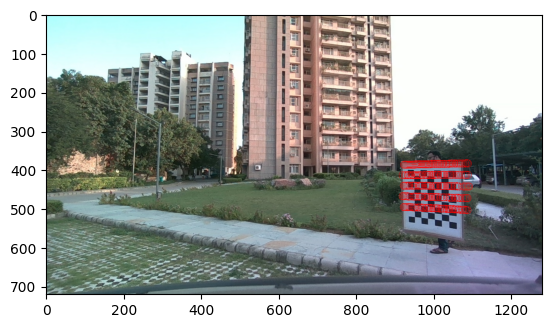

1 frame_1075.pcd


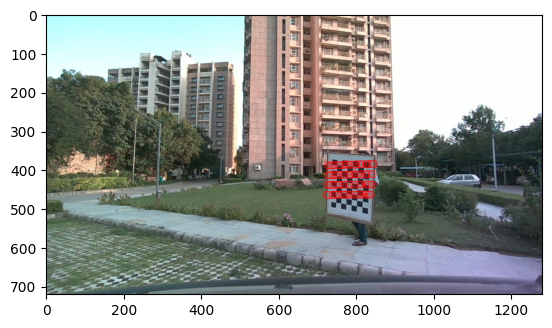

2 frame_1093.pcd


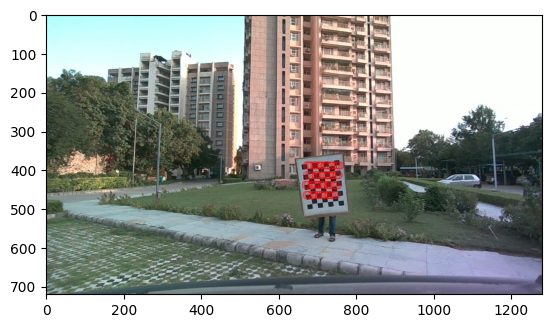

3 frame_1139.pcd


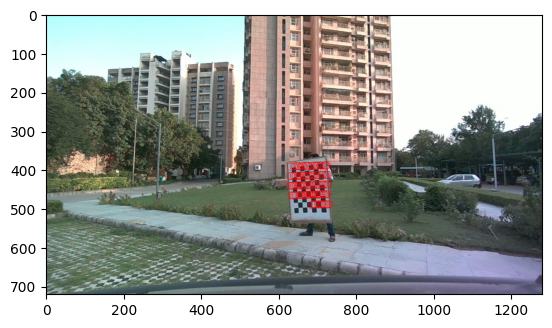

4 frame_1153.pcd


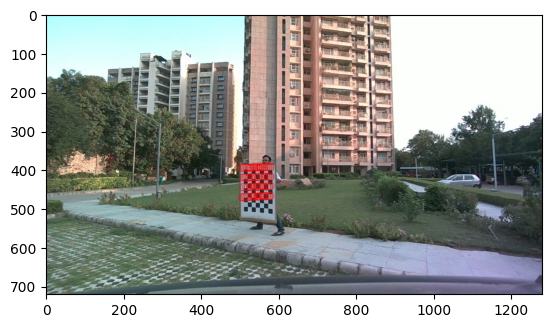

5 frame_1163.pcd


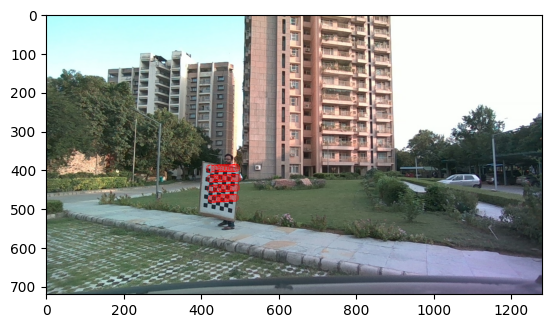

6 frame_1195.pcd


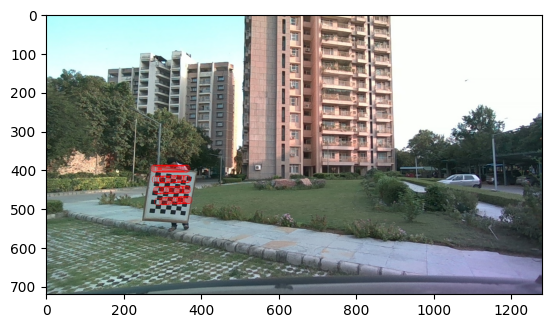

7 frame_1366.pcd


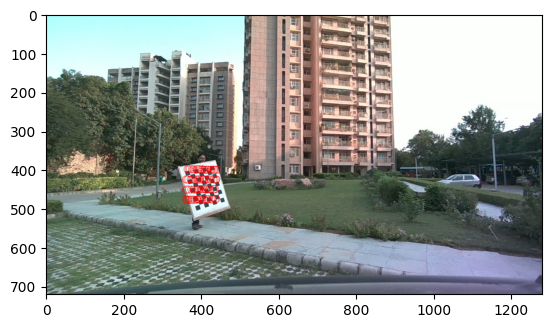

8 frame_1430.pcd


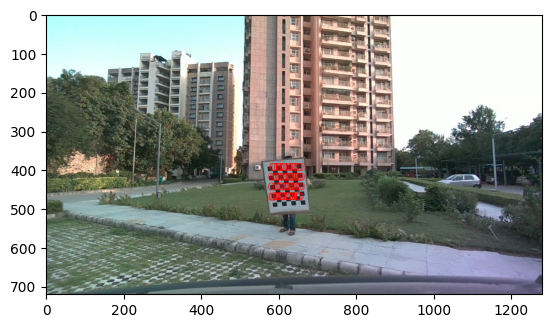

9 frame_1473.pcd


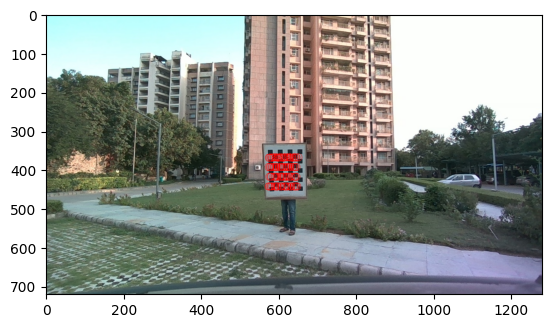

10 frame_1558.pcd


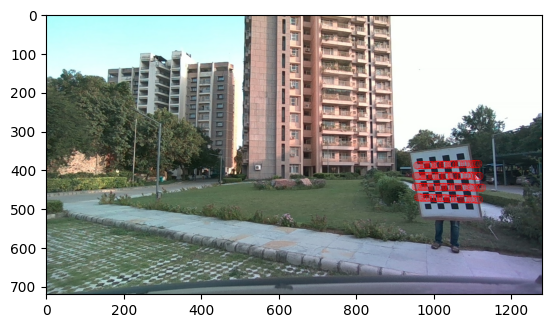

11 frame_1580.pcd


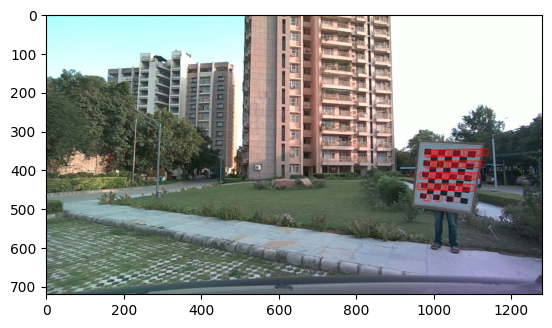

12 frame_1638.pcd


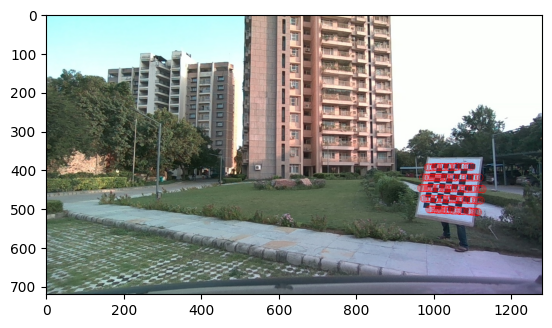

13 frame_1698.pcd


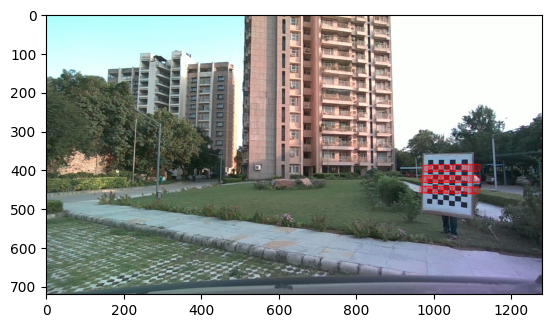

14 frame_1725.pcd


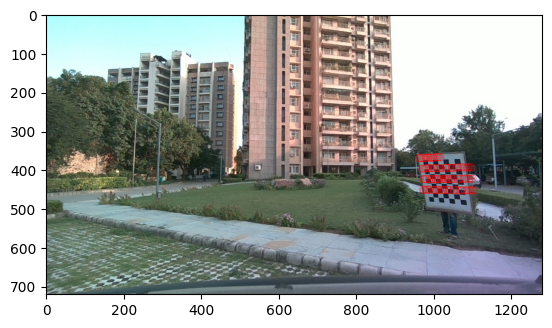

15 frame_1798.pcd


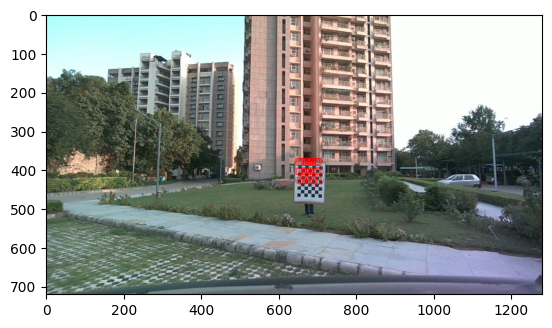

16 frame_1816.pcd


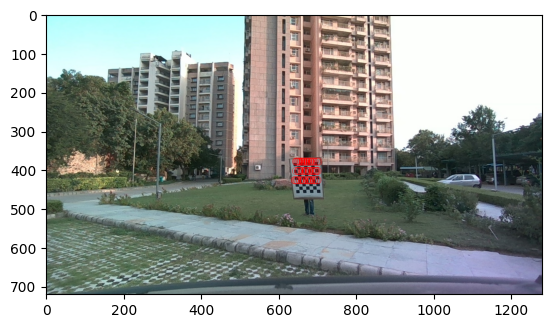

17 frame_1850.pcd


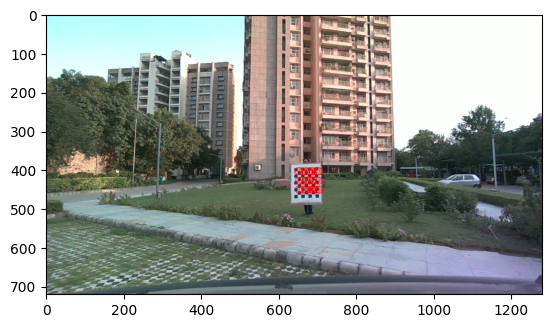

18 frame_2030.pcd


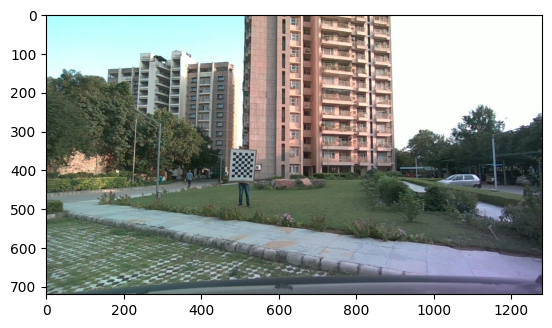

18 frame_2107.pcd


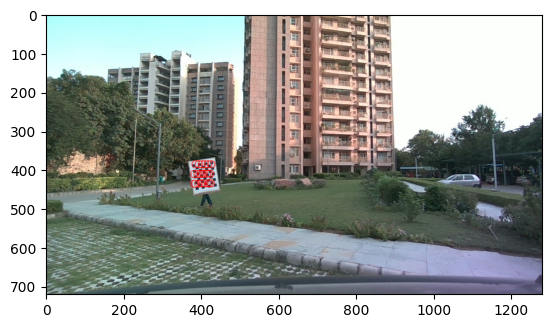

19 frame_256.pcd


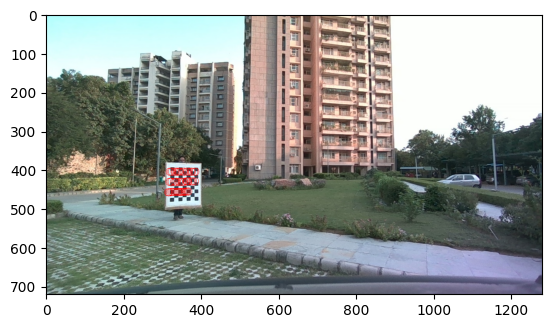

20 frame_2717.pcd


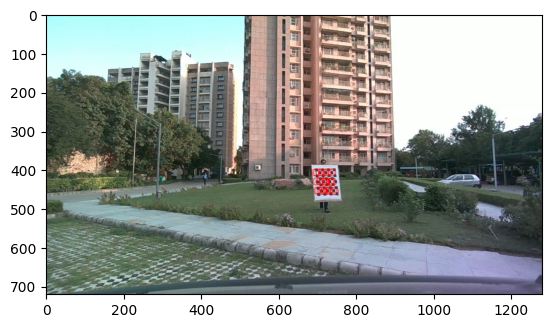

21 frame_2725.pcd


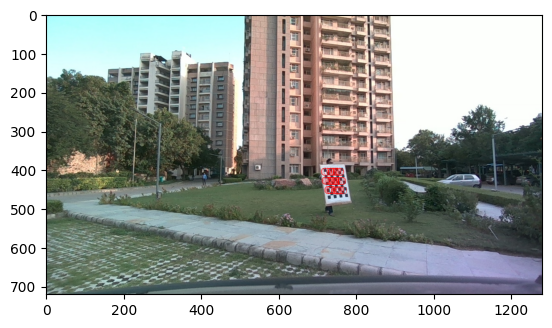

22 frame_2771.pcd


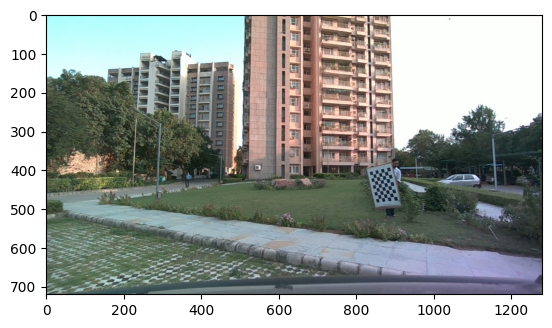

22 frame_2800.pcd


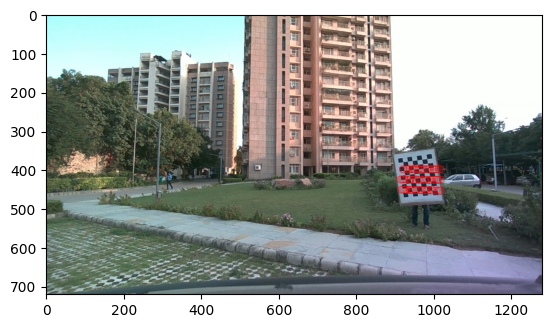

23 frame_2822.pcd


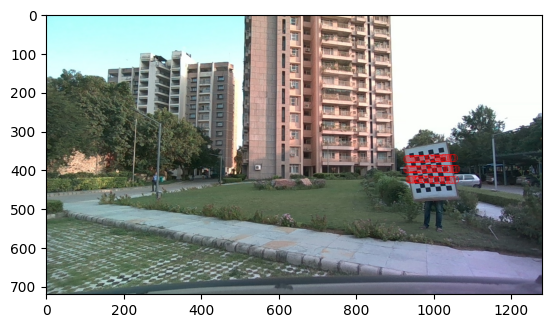

24 frame_2962.pcd


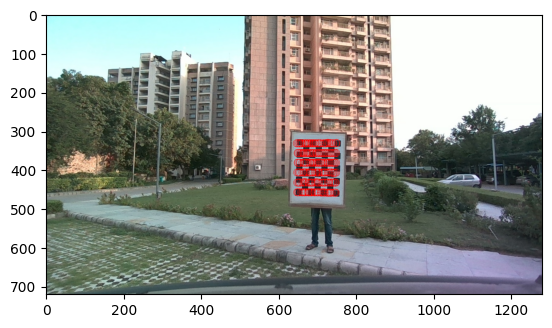

In [28]:
import matplotlib.pyplot as plt

index = 0
for pcd_file in pcd_files:
    # print(index)
    # please workkkkk
    if(index == 25): break
    print(index, pcd_file)
    img = cv2.imread(f"/content/drive/MyDrive/CV-A2-calibration/camera_images/{pcd_file[:-4]}.jpeg")
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ret, corners =cv2.findChessboardCorners(gray, (8, 6), None)
    if(ret == True):
        points = projection[index]
        index+=1

        for p in points:
            # print(index)
            cv2.circle(gray, (int(p[0]), int(p[1])), 10, (255, 0, 0), 1)

    plt.imshow(gray)
    plt.show()

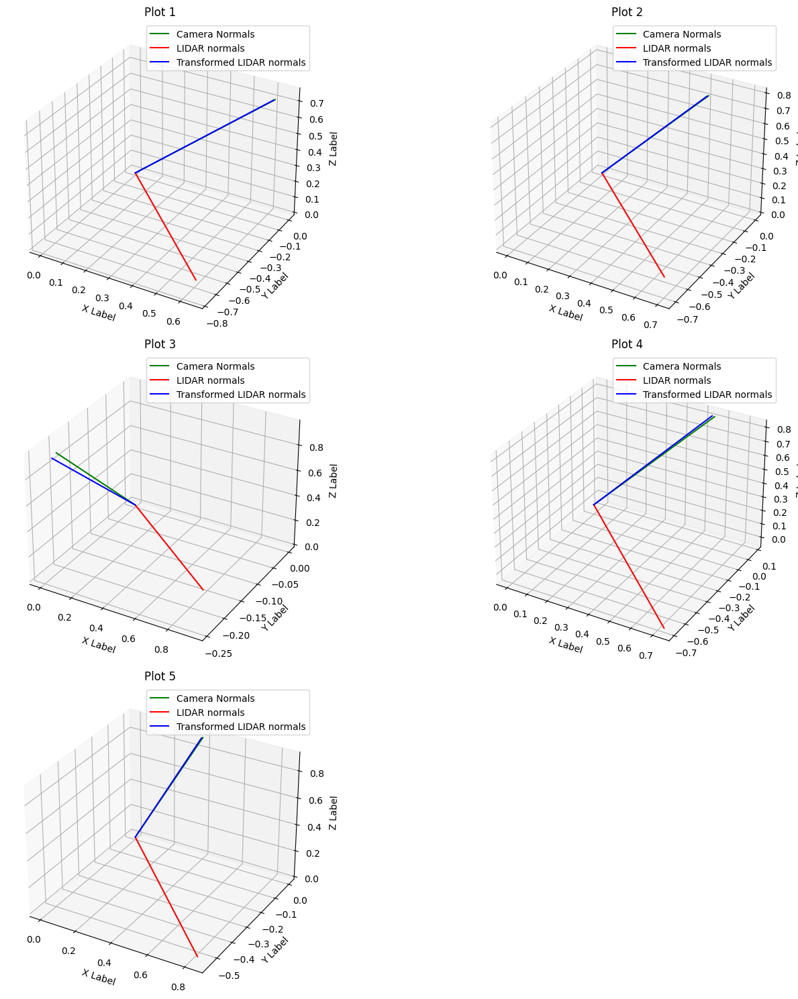

In [30]:
fig = plt.figure(figsize=(15, 15))


for i in range(5):
    ax = fig.add_subplot(3, 2, i+1, projection='3d')
    # color add karna hai
    ax.plot([0, tc[i, 0]], [0, tc[i, 1]], [0, tc[i, 2]], color='g')
    ax.plot([0, tl[i, 0]], [0, tl[i, 1]], [0, tl[i, 2]], color='r')
    Rltl = R @ tl.T
    ax.plot([0, Rltl[0, i]], [0, Rltl[1, i]], [0, Rltl[2, i]], color='b')

    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    ax.set_title(f"Plot {i+1}")
    ax.legend(['Camera Normals', 'LIDAR normals', 'Transformed LIDAR normals'])

plt.tight_layout()
plt.show()


In [ ]:
from scipy.spatial.distance import cosine

# Compute cosine distance for each pair
cosine_distances = []
for i in range(len(tc)):
    cosine_distance = cosine(tc[i], Rltl[:, i])
    cosine_distances.append(cosine_distance)


In [ ]:
print("Cosine Distance")
print(cosine_distances)

Cosine Distance
[3.344726106702112e-05, 3.5949256596778945e-05, 0.00015494572496088654, 7.683248640666385e-05, 2.3228069170322385e-05, 6.987864159679891e-05, 5.803737508680573e-05, 0.0002548383002609622, 0.00010853305560454274, 4.166541006966895e-05, 9.460320037568692e-05, 2.662930185659551e-05, 0.00046114258654250673, 7.699540172856345e-05, 3.1710677265484044e-05, 0.00027988999316064245, 2.2543093892601895e-05, 6.508861727627657e-05, 0.00011322154013004848, 0.0006117918594878979, 0.00032966283647262173, 1.420326250645143e-05, 9.90361180186472e-06, 0.00022756538153345662, 0.001425112494330194, 3.0404094682134897e-05, 0.0001084175576672175, 0.0008469260050651961, 5.799497606562287e-05, 2.925742150772237e-05, 0.00011625235290968483, 0.0007036890019936903, 0.0005411515899709229, 0.0001477574223767153, 0.0005915277359680449, 1.0416175286631635e-05, 1.622605047624237e-05, 0.016734977216240288]


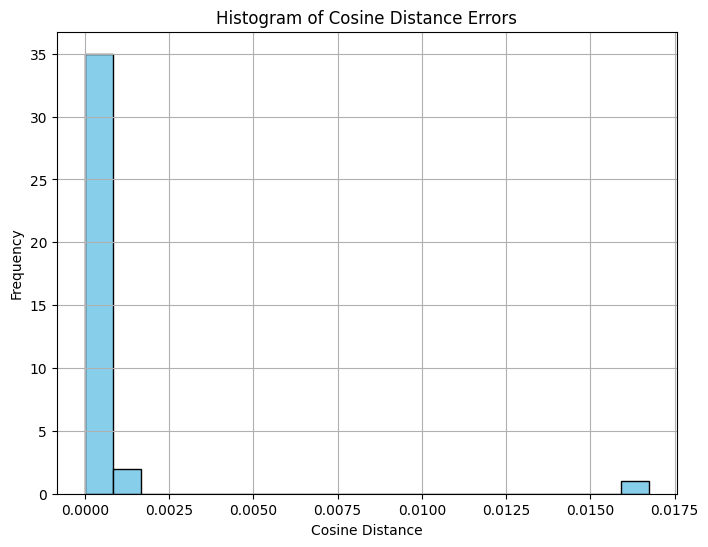

In [ ]:

# Plot histogram
plt.figure(figsize=(8, 6))
plt.hist(cosine_distances, bins=20, color='skyblue', edgecolor='black')
plt.title('Histogram of Cosine Distance Errors')
plt.xlabel('Cosine Distance')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()



In [ ]:
avg_error = np.mean(cosine_distances)
std_dev = np.std(cosine_distances)

print(f"Average Error: {avg_error}")
print(f"Standard Deviation: {std_dev}")


Average Error: 0.0006469057115629331
Standard Deviation: 0.0026610024941255733
